In [1]:
import numpy as np
import tensorflow as tf

import matplotlib.pyplot as plt
%matplotlib inline

## Create neural network

In [2]:
vggmean = [123.68, 116.779, 103.939]
h_input, w_input = 224, 224

In [3]:
from scipy.io import loadmat


class ModelParameters:
    def __init__(self, mat_file):
        params = loadmat(mat_file)
        self.layers = params['layers'][0]
        
    def weights(self, i):
        weights = self.layers[i][0][0][2][0][0]
        return weights
    
    def bias(self, i):
        bias = self.layers[i][0][0][2][0][1]
        return np.reshape(bias, (bias.size))


In [4]:
graph = tf.Graph()
sess = tf.InteractiveSession(graph=graph)

In [5]:
def T(layer):
    return graph.get_tensor_by_name("{}:0".format(layer))


In [6]:
def conv_layer(name, prev, W, b):
    with tf.variable_scope(name):
        prev = tf.nn.conv2d(prev, tf.constant(W, name='W'), strides=[1, 1, 1, 1], padding='SAME', name='conv')
        prev = tf.nn.bias_add(prev, tf.constant(b, name='b'), name='bias')
        prev = tf.nn.relu(prev, name='relu')
    return prev


def pool_layer(name, prev):
    return tf.nn.max_pool(prev, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='SAME', name=name)


In [7]:
def vgg19(mat_file):
    params = ModelParameters(mat_file)
    
    prev = tf.Variable(np.zeros((1, h_input, w_input, 3), dtype=np.float32), name='input')
    t_input = prev
    
    # with tf.variable_scope('preprocess'):
    #     prev = tf.Variable(np.zeros((h_input, w_input, 3), dtype=np.float32), name='input')
    #     t_input = prev
    #
    #     prev = tf.mul(prev, tf.constant(255.0, name='color_scale'))
    #     prev = tf.sub(prev, tf.constant(vggmean, name='mean'))
    #     prev = tf.reshape(prev, [1, h_input, w_input, 3])
    
    prev = conv_layer('conv1_1', prev, W=params.weights(0), b=params.bias(0))    
    prev = conv_layer('conv1_2', prev, W=params.weights(2), b=params.bias(2))
        
    prev = pool_layer('pool1', prev)
        
    prev = conv_layer('conv2_1', prev, W=params.weights(5), b=params.bias(5))
    prev = conv_layer('conv2_2', prev, W=params.weights(7), b=params.bias(7))
        
    prev = pool_layer('pool2', prev)
        
    prev = conv_layer('conv3_1', prev, W=params.weights(10), b=params.bias(10))
    prev = conv_layer('conv3_2', prev, W=params.weights(12), b=params.bias(12))
    prev = conv_layer('conv3_3', prev, W=params.weights(14), b=params.bias(14))
    prev = conv_layer('conv3_4', prev, W=params.weights(16), b=params.bias(16))
        
    prev = pool_layer('pool3', prev)
        
    prev = conv_layer('conv4_1', prev, W=params.weights(19), b=params.bias(19))
    prev = conv_layer('conv4_2', prev, W=params.weights(21), b=params.bias(21))
    prev = conv_layer('conv4_3', prev, W=params.weights(23), b=params.bias(23))
    prev = conv_layer('conv4_4', prev, W=params.weights(25), b=params.bias(25))
        
    prev = pool_layer('pool4', prev)
        
    prev = conv_layer('conv5_1', prev, W=params.weights(28), b=params.bias(25))
    prev = conv_layer('conv5_2', prev, W=params.weights(30), b=params.bias(30))
    prev = conv_layer('conv5_3', prev, W=params.weights(32), b=params.bias(32))
    prev = conv_layer('conv5_4', prev, W=params.weights(34), b=params.bias(34))
        
    prev = pool_layer('pool5', prev)
        
    return t_input


In [8]:
t_input = vgg19('./models/imagenet-vgg-verydeep-19.mat')

## Plot tensorflow graph

In [9]:
from IPython.display import clear_output, Image, display, HTML

def strip_consts(graph_def, max_const_size=32):
    """Strip large constant values from graph_def."""
    strip_def = tf.GraphDef()
    for n0 in graph_def.node:
        n = strip_def.node.add() 
        n.MergeFrom(n0)
        if n.op == 'Const':
            tensor = n.attr['value'].tensor
            size = len(tensor.tensor_content)
            if size > max_const_size:
                tensor.tensor_content = bytes("<stripped {} bytes>".format(size))
    return strip_def

  
def rename_nodes(graph_def, rename_func):
    res_def = tf.GraphDef()
    for n0 in graph_def.node:
        n = res_def.node.add() 
        n.MergeFrom(n0)
        n.name = rename_func(n.name)
        for i, s in enumerate(n.input):
            n.input[i] = rename_func(s) if s[0]!='^' else '^'+rename_func(s[1:])
    return res_def


def show_graph(graph_def, max_const_size=32):
    """Visualize TensorFlow graph."""
    if hasattr(graph_def, 'as_graph_def'):
        graph_def = graph_def.as_graph_def()
    strip_def = strip_consts(graph_def, max_const_size=max_const_size)
    code = """
        <script>
          function load() {{
            document.getElementById("{id}").pbtxt = {data};
          }}
        </script>
        <link rel="import" href="https://tensorboard.appspot.com/tf-graph-basic.build.html" onload=load()>
        <div style="height:600px">
          <tf-graph-basic id="{id}"></tf-graph-basic>
        </div>
    """.format(data=repr(str(strip_def)), id='graph'+str(np.random.rand()))
  
    iframe = """
        <iframe seamless style="width:950px;height:620px;border:0" srcdoc="{}"></iframe>
    """.format(code.replace('"', '&quot;'))
    display(HTML(iframe))


In [10]:
show_graph(graph.as_graph_def())

# Artistic Style

In [10]:
from skimage.transform import resize
import PIL.Image
from io import BytesIO


def preprocess(img, mean, crop=False):
    img = np.uint8(img)
    
    if crop:
        img = crop_image(img)
        
    img = img - mean
    
    return np.float32(img[np.newaxis,:,:,:])


def crop_image(img):
    h_input, w_input = 224, 224
    
    h, w, _ = img.shape
    if h < w:
        size_ = (h_input, w_input * w / h)
    else:
        size_ = (h_input * h / w, w_input)
    img = resize(img, size_, preserve_range=True) 
        
    h, w, _ = img.shape
    img = img[(h - h_input) // 2 : (h + h_input) // 2,
              (w - w_input) // 2 : (w + w_input) // 2]
    
    return img


def deprocess(img, mean):
    img = img[0] + mean
    return np.uint8(np.clip(img, 0, 255))


def showarray(a, fmt='jpeg'):
    a = np.uint8(np.clip(a, 0, 1) * 255)
    f = BytesIO()
    PIL.Image.fromarray(a).save(f, fmt)
    display(Image(data=f.getvalue()))


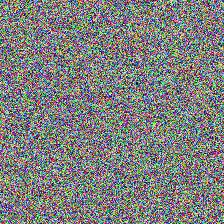

In [11]:
img_noise = np.random.randint(0, 255, (h_input, w_input, 3))
img_noise = preprocess(img_noise, vggmean)
showarray(deprocess(img_noise, vggmean) / 255.0)

## Content layer

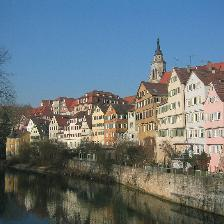

In [12]:
img_content = PIL.Image.open('Tuebingen_Neckarfront.jpg')
img_content = preprocess(img_content, vggmean, crop=True)
showarray(deprocess(img_content, vggmean) / 255.0)

In [13]:
def content_layer_loss(p, x):
    return 0.5 * tf.reduce_sum(tf.pow((x - p), 2))

### Variant 1

In [15]:
content_layers_names = ['conv4_2/relu']
content_layers_tensors = map(T, content_layers_names)

sess.run(t_input.assign(img_content))
content_layers_values = sess.run(content_layers_tensors)

In [14]:
def total_layers_loss(l_tensors, l_values, layer_loss):
    train_tensor = 0
    for tensor, value in zip(l_tensors, l_values):
        train_tensor += layer_loss(tensor, value)
    train_tensor /= len(l_tensors)
    return train_tensor


In [17]:
t_content_loss = total_layers_loss(
    content_layers_tensors,
    content_layers_values,
    content_layer_loss
)

In [25]:
def train(t_loss, img=img_noise, lr=2.0, imgs_n=8, iters_n=40):
    optimizer = tf.train.AdamOptimizer(learning_rate=lr)
    train_op = optimizer.minimize(t_loss, var_list=[t_input])
    
    init_op = tf.initialize_all_variables()
    sess.run(init_op)
    sess.run(t_input.assign(img))
    
    loss, imgs_content = [], [] 

    loss.append(sess.run(t_loss))
    imgs_content.append(sess.run(t_input))

    for j in range(imgs_n):    
        loss.append(0)

        for i in range(iters_n):
            sess.run(train_op)
            loss[-1] = sess.run(t_loss)
            clear_output()
            print j+1, '[' + (i + 1) * '-' + (iters_n - i - 1) * ' ' + ']'
            print loss
        
        imgs_content.append(sess.run(t_input))
    return imgs_content

In [19]:
imgs_content = train(t_content_loss)

8 [---------------------------------------- ]
[1.281305e+11, 1.8369966e+10, 6.2151439e+09, 3.0322422e+09, 1.8767199e+09, 1.3541436e+09, 1.0509266e+09, 8.5158477e+08, 7.4282227e+08]


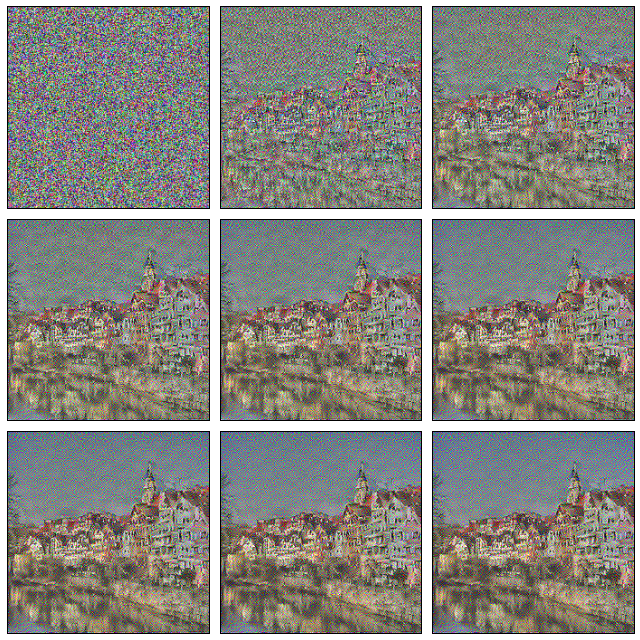

In [20]:
plt.figure(figsize=(9, 9))

for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.gca().xaxis.set_visible(False)    
    plt.gca().yaxis.set_visible(False)    
    plt.imshow(deprocess(imgs_content[i], vggmean))
    
plt.tight_layout()

### Variant 2

In [21]:
content_layers_names = ['conv1_1/relu', 'conv2_1/relu', 'conv4_2/relu']
content_layers_tensors = map(T, content_layers_names)

sess.run(t_input.assign(img_content))
content_layers_values = sess.run(content_layers_tensors)

In [22]:
t_content_loss = total_layers_loss(
    content_layers_tensors,
    content_layers_values,
    content_layer_loss
)

In [23]:
imgs_content = train(t_content_loss)

8 [---------------------------------------- ]
[6.7529495e+10, 1.1216319e+10, 3.8959411e+09, 1.8787073e+09, 1.1890353e+09, 8.5950592e+08, 5.8612531e+08, 4.9024931e+08, 3.7155843e+08]


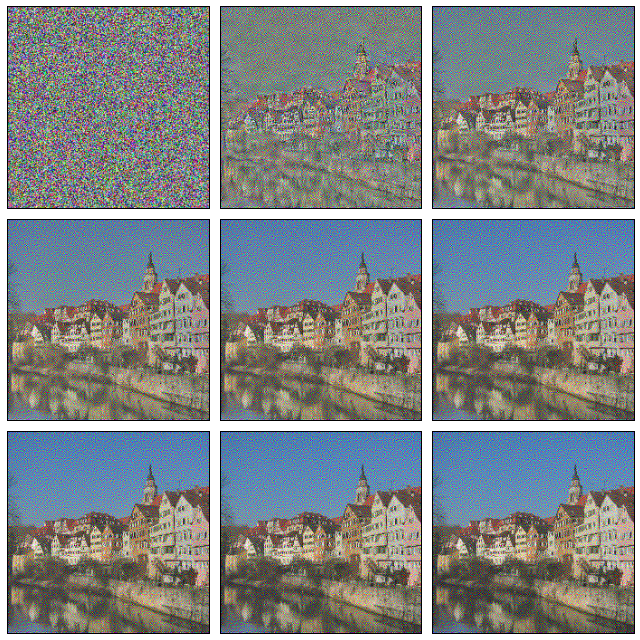

In [24]:
plt.figure(figsize=(9, 9))

for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.gca().xaxis.set_visible(False)    
    plt.gca().yaxis.set_visible(False)    
    plt.imshow(deprocess(imgs_content[i], vggmean))
    
plt.tight_layout()

## Style loss

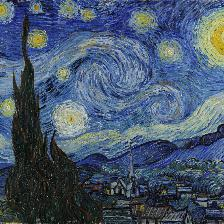

In [16]:
img_style = PIL.Image.open('1280px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg')
img_style = preprocess(img_style, vggmean, crop=True)
showarray(deprocess(img_style, vggmean) / 255.0)

In [17]:
def G(x):
    try:
        _, h, w, d = map(lambda f: f.value, x.get_shape())
    except AttributeError:
        _, h, w, d = x.shape
    prev = tf.reshape(x, [h * w, d])
    prev = tf.matmul(tf.transpose(prev), prev)
    return prev


def FB_norm_sq(x):
    return tf.reduce_sum(tf.pow(x, 2))
    

def style_layer_loss(p, x):
    _, h, w, d = map(lambda f: f.value, p.get_shape())
    C = 1. / (2. * h * w * d) ** 2
    return C * FB_norm_sq(G(p) - G(x))


### Variant 1

In [27]:
style_layers_names = ['conv4_2/relu']
style_layers_tensors = map(T, style_layers_names)

sess.run(t_input.assign(img_style))
style_layers_values = sess.run(style_layers_tensors)

In [28]:
t_style_loss = total_layers_loss(
    style_layers_tensors,
    style_layers_values,
    style_layer_loss
)

In [29]:
imgs_style = train(t_style_loss)

8 [---------------------------------------- ]
[2.2310961e+10, 8.1999392e+08, 3.4892592e+08, 2.2699917e+08, 1.7040618e+08, 1.3800058e+08, 1.1673706e+08, 1.017267e+08, 90520320.0]


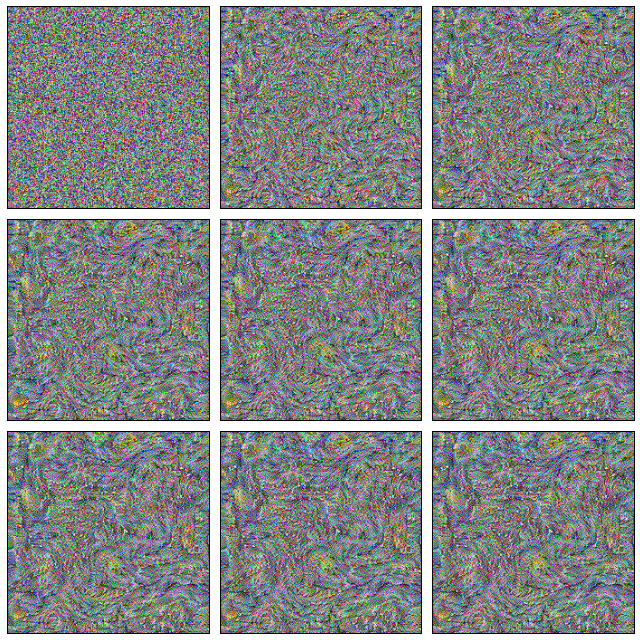

In [30]:
plt.figure(figsize=(9, 9))

for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.gca().xaxis.set_visible(False)    
    plt.gca().yaxis.set_visible(False)    
    plt.imshow(deprocess(imgs_style[i], vggmean))
    
plt.tight_layout()

### Variant 2

In [31]:
style_layers_names = ['conv1_1/relu', 'conv2_1/relu', 'conv3_1/relu', 'conv4_1/relu', 'conv5_1/relu']
style_layers_tensors = map(T, style_layers_names)

sess.run(t_input.assign(img_style))
style_layers_values = sess.run(style_layers_tensors)

In [32]:
t_style_loss = total_layers_loss(
    style_layers_tensors,
    style_layers_values,
    style_layer_loss
)

In [33]:
imgs_style = train(t_style_loss)

8 [---------------------------------------- ]
[2.6329201e+10, 7.8882086e+08, 2.8744736e+08, 1.7161699e+08, 1.2252744e+08, 96440664.0, 80047112.0, 68405016.0, 59618860.0]


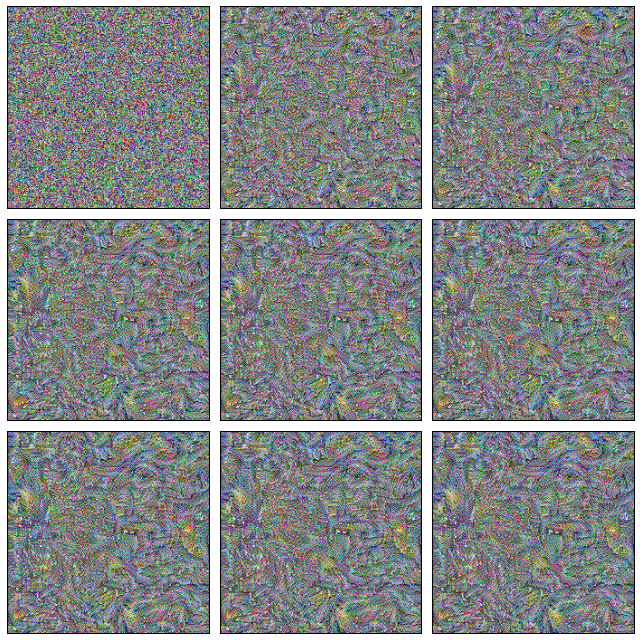

In [34]:
plt.figure(figsize=(9, 9))

for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.gca().xaxis.set_visible(False)    
    plt.gca().yaxis.set_visible(False)    
    plt.imshow(deprocess(imgs_style[i], vggmean))
    
plt.tight_layout()

## Artistic style

In [28]:
content_layers_names = ['conv4_2/relu']
content_layers_tensors = map(T, content_layers_names)

sess.run(t_input.assign(img_content))
content_layers_values = sess.run(content_layers_tensors)

In [29]:
t_content_loss = total_layers_loss(
    content_layers_tensors,
    content_layers_values,
    content_layer_loss
)

In [30]:
style_layers_names = ['conv1_1/relu', 'conv2_1/relu', 'conv3_1/relu', 'conv4_1/relu', 'conv5_1/relu']
style_layers_tensors = map(T, style_layers_names)

sess.run(t_input.assign(img_style))
style_layers_values = sess.run(style_layers_tensors)

In [31]:
t_style_loss = total_layers_loss(
    style_layers_tensors,
    style_layers_values,
    style_layer_loss
)

In [44]:
t_total_loss = .2 * t_content_loss + .8 * t_style_loss

In [45]:
imgs_result = train(t_total_loss)

8 [----------------------------------------]
[4.7207186e+10, 8.3116447e+09, 5.2713841e+09, 4.3843185e+09, 3.9938074e+09, 3.7732173e+09, 3.635038e+09, 3.5404657e+09, 3.473036e+09]


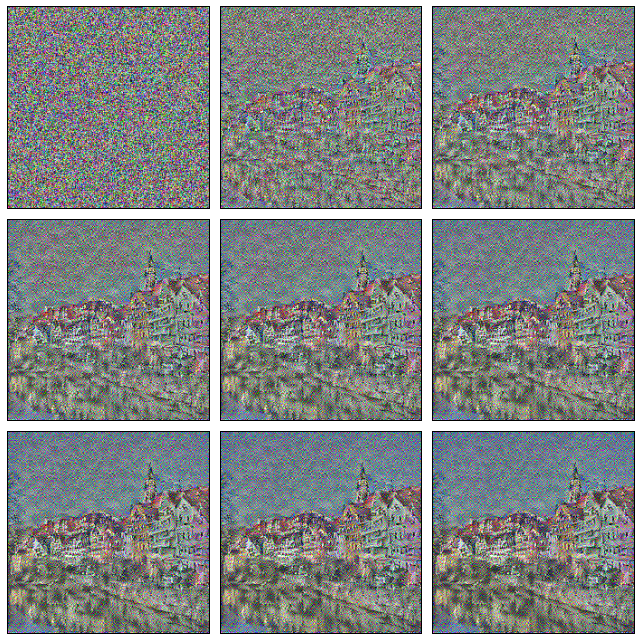

In [46]:
plt.figure(figsize=(9, 9))

for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.gca().xaxis.set_visible(False)    
    plt.gca().yaxis.set_visible(False)    
    plt.imshow(deprocess(imgs_result[i], vggmean))
    
plt.tight_layout()

## Smoothing

In [35]:
def variation_layer_loss(layer=t_input):
    a = tf.pow(layer[:, :-1, :-1, :] - layer[:, 1:, :-1, :], 2)
    b = tf.pow(layer[:, :-1, :-1, :] - layer[:, :-1, 1:, :], 2)
    return tf.reduce_sum(tf.pow(a + b, 1.25))

In [36]:
t_variation_loss = variation_layer_loss()

In [37]:
t_total_loss = .05 * t_content_loss + .9 * t_style_loss + .3 * t_variation_loss

### V1

In [38]:
imgs_result = train(t_total_loss, img=img_noise)

8 [----------------------------------------]
[4.3454018e+10, 9.53651e+09, 4.7483069e+09, 3.2282117e+09, 2.616894e+09, 2.3175204e+09, 2.1452001e+09, 2.0330573e+09, 1.9552851e+09]


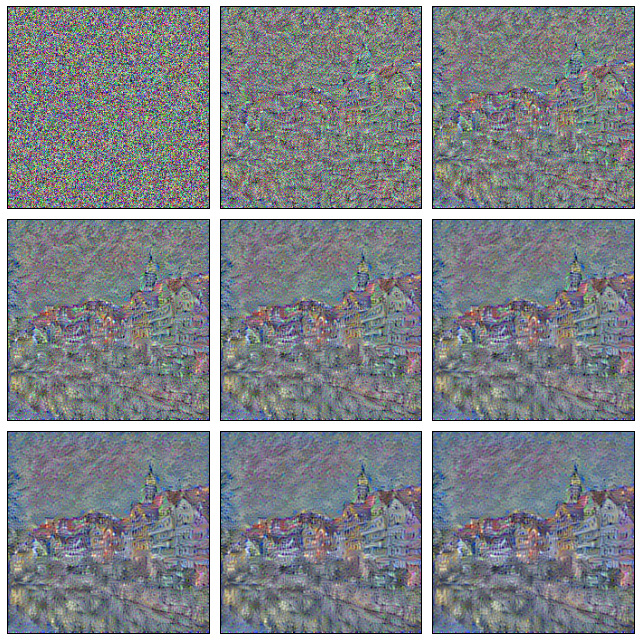

In [39]:
plt.figure(figsize=(9, 9))

for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.gca().xaxis.set_visible(False)    
    plt.gca().yaxis.set_visible(False)    
    plt.imshow(deprocess(imgs_result[i], vggmean))
    
plt.tight_layout()

### V2

In [40]:
imgs_result = train(t_total_loss, img=img_content)

8 [----------------------------------------]
[6.9460439e+09, 1.9673107e+09, 1.7699167e+09, 1.7060093e+09, 1.6733708e+09, 1.6544774e+09, 1.6400207e+09, 1.629707e+09, 1.6229021e+09]


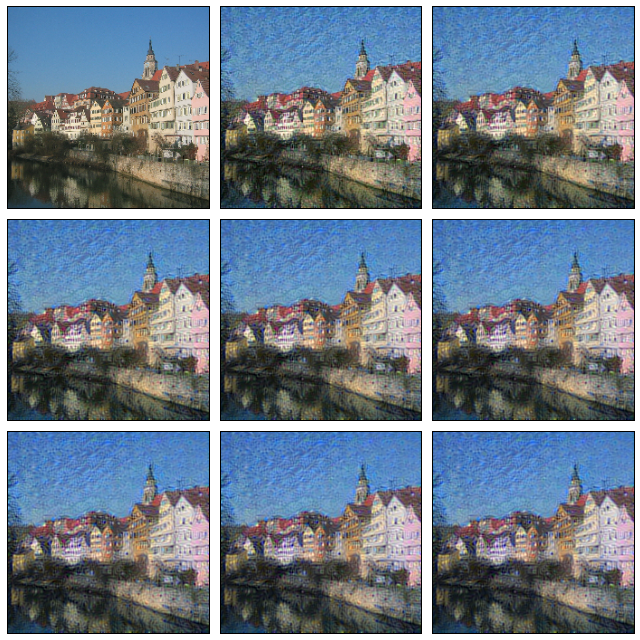

In [41]:
plt.figure(figsize=(9, 9))

for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.gca().xaxis.set_visible(False)    
    plt.gca().yaxis.set_visible(False)    
    plt.imshow(deprocess(imgs_result[i], vggmean))
    
plt.tight_layout()

### V3

In [42]:
imgs_result = train(t_total_loss, img=img_style)

8 [----------------------------------------]
[8.3390372e+09, 2.5709215e+09, 2.0367649e+09, 1.8671709e+09, 1.7834348e+09, 1.7323936e+09, 1.6960494e+09, 1.6726775e+09, 1.6554697e+09]


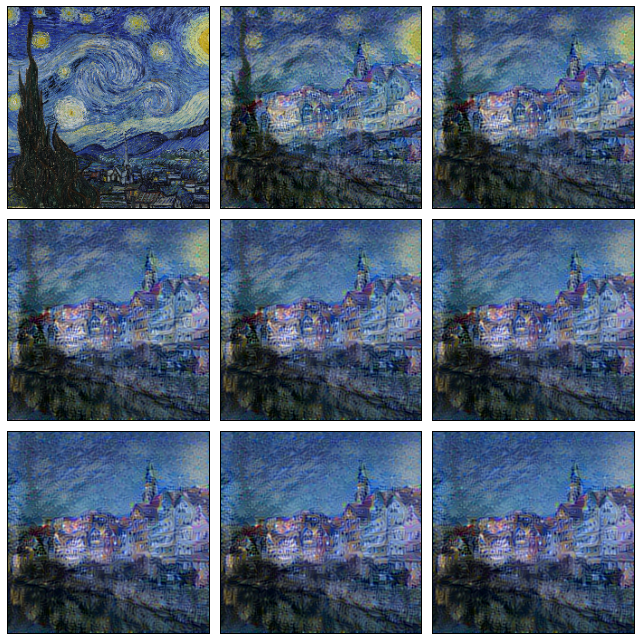

In [43]:
plt.figure(figsize=(9, 9))

for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.gca().xaxis.set_visible(False)    
    plt.gca().yaxis.set_visible(False)    
    plt.imshow(deprocess(imgs_result[i], vggmean))
    
plt.tight_layout()